# Read raw data

In [88]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt

# Read ground truth values for all 500k images
ground_truth = np.genfromtxt('gt_train.csv', delimiter=',', dtype=['u4', 'U50'])

# Put image titles and their labels in a dictionary for easy retrieval
# Format: [imageNumber:Label]. Ex: [43123:'pedestrian']

gt = {}
for img in ground_truth:
    gt[img[0]] = img[1]

# Load 1000 grey images from each catagory and put them in the lists below
images = []
names = []
labels = []
for f in sorted(glob.glob("MIO-TCD-Classification/train/*")):
    s=0
    for g in sorted(glob.glob(str(f)+'/*.jpg')):
        img = cv2.imread(g, 0) # Read image in grey
        name = int(g[-12:-4]) # File name
        images.append(img)
        names.append(name)
        labels.append(gt[name])
        s += 1
        
        # To load only a thousand from each catagory
        if (s == 1000):
            break
print(len(images), 'images were read with their names and labels (1000 from each catagory)')

11000 images were read with their names and labels (1000 from each catagory)


# PROJECT PART 1: CLASSIFICATION

## HoG Features

In [89]:
# Function to compute hog features
def hog(img):
    cell_size = (4, 4)  # h x w in pixels
    block_size = (4, 4)  # h x w in cells
    nbins = 8  # number of orientation bins

    # create HoG Object
    # winSize is the size of the image cropped to an multiple of the cell size
    hog = cv2.HOGDescriptor(_winSize=(img.shape[1] // cell_size[1] * cell_size[1],
                                      img.shape[0] // cell_size[0] * cell_size[0]),
                            _blockSize=(block_size[1] * cell_size[1],
                                        block_size[0] * cell_size[0]),
                            _blockStride=(cell_size[1], cell_size[0]),
                            _cellSize=(cell_size[1], cell_size[0]),
                            _nbins=nbins)

    n_cells = (img.shape[0] // cell_size[0], img.shape[1] // cell_size[1])

    # Compute HoG features
    hog_feats = hog.compute(img)\
                   .reshape(n_cells[1] - block_size[1] + 1,
                            n_cells[0] - block_size[0] + 1,
                            block_size[0], block_size[1], nbins) \
                   .transpose((1, 0, 2, 3, 4))  # index blocks by rows first
    
    # hog_feats now contains the gradient amplitudes for each direction,for each cell of its group for each group.
    # Indexing is by rows then columns.

    # computation for BlockNorm
    gradients = np.full((n_cells[0], n_cells[1], 8), 0, dtype=float)
    cell_count = np.full((n_cells[0], n_cells[1], 1), 0, dtype=int)

    for off_y in range(block_size[0]):
        for off_x in range(block_size[1]):
            gradients[off_y:n_cells[0] - block_size[0] + off_y + 1,
                      off_x:n_cells[1] - block_size[1] + off_x + 1] += \
                hog_feats[:, :, off_y, off_x, :]
            cell_count[off_y:n_cells[0] - block_size[0] + off_y + 1,
                       off_x:n_cells[1] - block_size[1] + off_x + 1] += 1

    # Average gradients
    gradients /= cell_count
    return gradients

## Compute HoG Features

In [92]:
hogs_temp = []

#calculate hog for each image
for image in images:
    #the classifier takes 2d training data. hog produces 3d so we flatten the result to make it 1d.. then we
    #group all hogs in one list to make a 2d list

    grad = hog(cv2.resize(image, (50, 50), interpolation=cv2.INTER_AREA)).flatten()

    hogs_temp.append(grad)

#convert the HoGs array to np array to be processed
hogs_temp = np.array(hogs_temp)
hogs = hogs_temp

print('Shape of the hogs list: ',hogs.shape)

Shape of the hogs list:  (11000, 1152)


## Split data and Classify using KNN and SVM

In [93]:
from sklearn import svm
from sklearn.model_selection import  train_test_split 
from sklearn.neighbors import KNeighborsClassifier as knc

X_train, X_test, y_train, y_test = train_test_split(hogs, labels, test_size=0.25)


########################################################
## SVM CLASSIFIER
# https://scikit-learn.org/stable/modules/svm.html

# Create svm Linear object
lin_clf = svm.LinearSVC()

lin_clf.fit(X_train, y_train)

p_svm = lin_clf.predict(X_test)
########################################################


########################################################
## KNN CLASSIFIER
knn = knc(n_neighbors = 3)

knn.fit(X_train, y_train)

p = knn.predict(X_test)
########################################################

#### Average classification accuracy across validations, with the standard deviation.

Use cross_val_score from the sklearn library to implement a k-fold cross-verification model.

In [94]:
from sklearn.model_selection import cross_val_score

scores1 = cross_val_score(knn, hogs, labels, cv=10)
print("KNN Scores", scores1)

scores2 = cross_val_score(lin_clf, hogs, labels, cv=10)
print("SVM Scores", scores2)

print("Accuracy: %0.2f (+/- %0.2f)" % (scores1.mean(), scores1.std() * 2))
print("Accuracy: %0.2f (+/- %0.2f)" % (scores2.mean(), scores2.std() * 2))

KNN Scores [0.55272727 0.60090909 0.71454545 0.72272727 0.73272727 0.67727273
 0.69636364 0.67363636 0.66363636 0.67545455]
SVM Scores [0.46727273 0.53545455 0.59545455 0.61636364 0.62818182 0.55636364
 0.58363636 0.59363636 0.54727273 0.61454545]
Accuracy: 0.67 (+/- 0.11)
Accuracy: 0.57 (+/- 0.09)


#### Average precision and recall across validations. Are these values consistent with the accuracy? Are they more representative of the dataset? In what situations would you expect precision and recall to be a better reflection of model performance than accuracy?

Precision and recall results are consistent with accuracy (SEE BELOW). 

The accuracy alone does not take into considerations the false positives nor the false negatives. It simply computes the number of correct predictions over the number of total predictions.  Therefore, computing the precision and recall would bring about a better representation of the data set and a better evaluation of the classifier’s performance. 


We compute precision and recall using: precision = TP/(TP + FP), recall = TP/(TP + FN) 
where TP is the number of true positives, FP is the number of false positives, and FN is the number of false negatives. 
We compute accuracy using: accuracy = number of correct predictionsnumber of total predictions

As mentioned before and as we can see from the formulas, accuracy doesn’t take into consideration the false positives and false negatives that may be detected. So, precision would be a better reflection of model performance than accuracy when the number of false positives is high and recall would be a  better reflection of model performance than accuracy when the number of false negatives is high.


In [95]:
from sklearn.metrics import precision_score as precision
from sklearn.metrics import recall_score as recall
from sklearn.metrics import precision_recall_curve

# or use sklearn function and output average instead of list
precision_SVM = precision(y_test, p_svm, average = 'weighted')

recall_SVM = recall(y_test, p_svm, average = 'weighted')

precision_KNN = precision(y_test, p, average = 'weighted')

recall_KNN = recall(y_test, p, average = 'weighted')


print("precision_SVM",precision_SVM)

print("recall_SVM",recall_SVM)

print("precision_KNN",precision_KNN)

print("recall_KNN",recall_KNN)

precision_SVM 0.5948835238752889
recall_SVM 0.596
precision_KNN 0.7193495403309029
recall_KNN 0.7032727272727273


#### Confusion matrix on a validation set. Plot thematrix as an image. Are any of the classes dificult for your classifier? Discuss.

We know that motion and occlusion may be potential hurdles to overcome when classifying images. From the confusion matrices for each classifier, we can see that the class that has the hardest time getting classified (most false positives) was the pick up class (for kNN) and the background class (for SVM). Indeed, when using KNN, some cars would be classified as pickups, increasing the number of false positive in the pick-ups predictions. The same thing happens with SVM and the background class as many pedestrians are classified as background, increasing the number of false positives in the background class. We can also see that our classifiers had some difficulties distinguishing between pedestrians and bicycles.

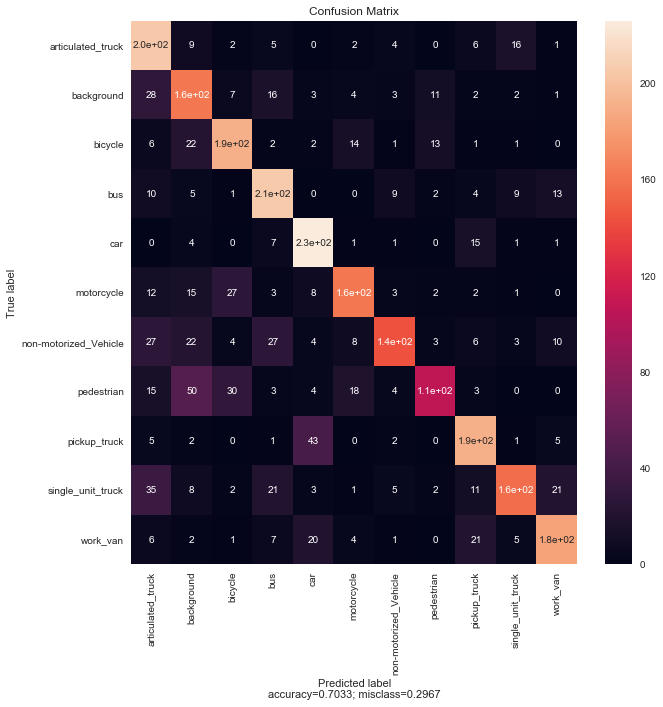

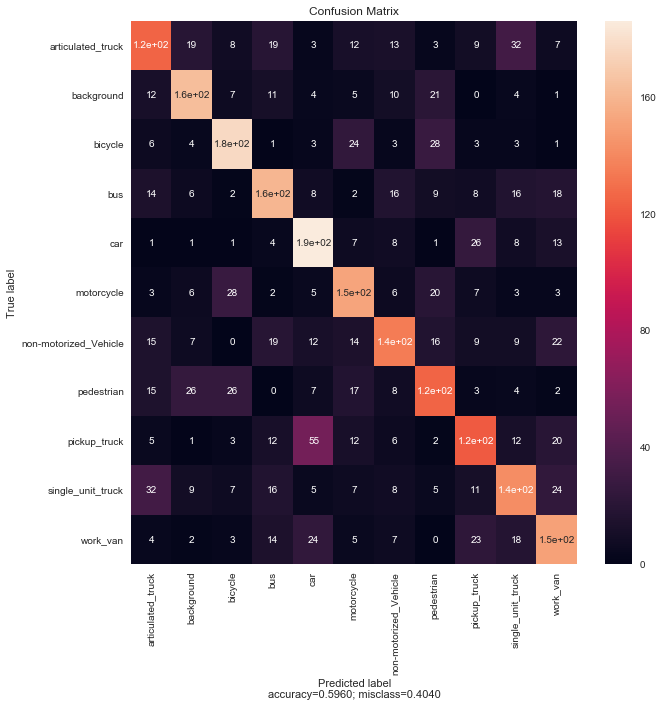

In [96]:
%matplotlib inline
import itertools
import numpy as np
import matplotlib.pyplot as plt

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

Targets=['articulated_truck', 'background', 'bicycle', 'bus','car','motorcycle','non-motorized_Vehicle', 'pedestrian','pickup_truck', 'single_unit_truck', 'work_van']

def plot_cm(cm, indx, colomn):
    accuracy= np.trace(cm)/ float(np.sum(cm))
    misclasses= 1- accuracy
    df_cm = pd.DataFrame(cm, index = [i for i in indx],columns = [i for i in colomn])
                  
    plt.figure(figsize = (10,10))
    sn.set(font_scale=1)#for label size
    sn.heatmap(df_cm, annot=True,annot_kws={"size": 10})# font size
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclasses))


# KNN RESULTS
cnf_matrix2 = confusion_matrix(y_test, p)

plot_cm(cnf_matrix2, Targets,Targets)

# SVM RESULTS
cnf_matrix = confusion_matrix(y_test, p_svm)

plot_cm(cnf_matrix,Targets, Targets)

# PROJECT PART 2: LOCALIZATION & CLASSIFICATION

### Helper functions:

In [97]:
from sklearn.ensemble import IsolationForest
from sklearn.metrics.pairwise import euclidean_distances as e_dist

# Function to calulate the intersection of union of two boxes
# Method was inspired by the official code that was provided with the dataset
def dice(bbox_1, bbox_2):
    '''
        Compute the IoU ratio between two bounding boxes
    '''

    # intersection box coords
    bi = [max(bbox_1[0], bbox_2[0]), max(bbox_1[1], bbox_2[1]),
          min(bbox_1[2], bbox_2[2]), min(bbox_1[3], bbox_2[3])]

    # width and height of intersection box
    iw = bi[2] - bi[0] + 1
    ih = bi[3] - bi[1] + 1

    ov = 0

    if iw > 0 and ih > 0:
        # ua = areaFirstBox + areaSecondBox - areaIntersection
        ua = (bbox_1[2] - bbox_1[0] + 1) * (bbox_1[3] - bbox_1[1] + 1) + \
             (bbox_2[2] - bbox_2[0] + 1) * (bbox_2[3] - bbox_2[1] + 1) - \
             iw * ih
        ov = iw * ih / float(ua)

    dice = (2 * ov) / (1 + ov)
    return dice

# In case of multiple boxes, match the boxes to maximze dice
# Run this method on every predicted box
def max_dice(boxP, boxesT):
    dices = []
    for box in boxesT:
        dices.append(dice(box, boxP))
    dices = np.array(dices)
    maxCoords = boxesT[np.argmax(dices)]
    return dices.max(), maxCoords


# function to compute hog features
def compute_hog(pictures):
    hogs_temp = []
    #calculate hog for each image
    max_len = 0
    avg = 0
    for image in pictures:
        #the classifier takes 2d training data. hog produces 3d so we flatten the result to make it 1d.. then we
        #group all hogs in one list to make a 2d list

        # [REVEIW] resize because knn expects all data to be symetric

        grad = hog(cv2.resize(image, (50, 50), interpolation=cv2.INTER_AREA)).flatten()
    #     grad = hog(image).flatten()
        avg += len(grad)
        if len(grad) > max_len:
            max_len = len(grad)
        hogs_temp.append(grad)

    #convert the HoGs array to np array to be processed
    hogs_temp = np.array(hogs_temp)
    
    hogs = hogs_temp
    print('Shape of the hogs list: ',hogs.shape, max_len)
    return hogs

# train an SVM classifier given a list of data(hogs) and their labels
def train_classifier(hog_list, label_list):
    X_train, X_test, y_train, y_test = train_test_split(hog_list, label_list, test_size=0.25)

    lin_clf = svm.LinearSVC()

    lin_clf.fit(X_train, y_train)

    p_svm = lin_clf.predict(X_test)

    # Accuracy
    k = 0
    for x in range(len(p_svm)):
        if p_svm[x] == y_test[x]:
            k += 1
    print('Accuracy of SVM is', k, 'out of', len(X_test), ', percentage: %', 100*k/len(X_test))
    
    return lin_clf

# detect "NOT-BACKGROUND"
def detection(hog_list):
    pred_back=[]
    p= np.array(bkg_classifer.predict(hog_list)) 
    pred=0
    for i in range(len(p)):
        
        if p[i] != 'background':
            pred= i
            pred_back.append(pred)
            
            
            
    pred_back= np.array(pred_back)
    return pred_back

def kmean(datas,k):
    data= np.float32(datas)
# before calling openCV's kmeans, we need to specify the stop criteria
# stop when either 100 iterations or an accuracy of 1 is reached
# define criteria = (type, max_iter=100, epsilon=1.0)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 1000, 1.0)

# set number of clusters
    K = k

# apply Kmeans
# cv2.kmeans(data, K, bestLabels, criteria, attempts, flags[, centers]) → retval, bestLabels, centers
# compactness: the sum of squared distance from each point to their corresponding centers
# labels: the label array (each element marked '0', '1', '2', etc.)
# centers: array of centers of clusters
    compactness, labels, centers = cv2.kmeans(data, K, None, criteria, 100, flags=cv2.KMEANS_RANDOM_CENTERS)
    
    return centers

# Function that generates sliding windows of differernt size on an image
# k represent the number of k-means to use when grouping those windows
def s_window(image,k):
    hogs_new = []
    max_len = 0
    avg = 0
    coord=[]
    size=[20,50,100,200]
    for value in size:
        for x in range(0,image.shape[1],20):
            for y in range(0,image.shape[0],20):
                sub = cv2.resize(image[y:y+value, x:x+value], (100,100))
                c= [x,y, value]
                coord.append(c)
                gradi = hog(cv2.resize(sub, (50, 50), interpolation=cv2.INTER_AREA)).flatten()


    #     grad = hog(image).flatten()
                avg += len(gradi)
                if len(gradi) > max_len:
                      max_len = len(gradi)
                hogs_new.append(gradi)

    #convert the HoGs array to np array to be processed
    hogs_new = np.array(hogs_new)
#     print('Hog features detected = ',len(hogs_new))
    # hogs = hogs_new

    d= detection(hogs_new)
#     print('Number of windows selected from HoG list =', len(d))

    rect=[]
    b_rect=[]
    for value in d:
        cpoint= coord[value]
        rect.append(cpoint)
    rect= np.array(rect)
    for pt in rect:
            box= [pt[0],pt[1],pt[0]+pt[2]+50,pt[1]+pt[2]]
            b_rect.append(box)
    b_rect= np.array(b_rect)
    
    coordinate= kmean(b_rect,k)
    
    b=[]
    for pts in coordinate:
        box= [pts[0], pts[1], pts[2], pts[3]]
#         print('Box found with coordinate= ', box )
        b.append(box)
    b= np.array(b)
    
    return b, b_rect


# Function to plot boxes on an image
def plot_boxes(image, coordinates):
    im_copy= image.copy()
    for pts in coordinates:
        boxes= cv2.rectangle(im_copy, (pts[0],pts[1]), (pts[2], pts[3]), (255,255,0), 5)
    boxes= cv2.cvtColor(boxes, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.subplot(111), plt.imshow(boxes, )
    plt.title("Bounding Boxes"), plt.xticks([]), plt.yticks([])# Find distance between two boxes

# Calculate the distance between two boxes
def box_distance(box1, box2):
    # center of each box
    cx1, cy1 = box1[0] + (box1[2]-box1[0]/2), box1[1] + (box1[3]-box1[1]/2)
    cx2, cy2 = box2[0] + (box2[2]-box2[0]/2), box2[1] + (box2[3]-box2[1]/2)
    
    point = [[cx1-cx2 , cy1-cy2]]
    point1= [[cx1,cy1]]
    point2=[[cx2,cy2]]
    # distance between centers
    dist = dist= np.sqrt(((cx2-cx1)**2)+(cy2-cy1)**2)
    
    return dist
    
# Merge boxes that are at a certain threshold from the mean box
def merge_boxes(mean, boxes):
    # Threshold is height or width of the mean box, the longest of them
    threshold = int((max(mean[2]-mean[0], mean[3]-mean[1]))*3)
    close_boxes = []
    for box in boxes:
        d = box_distance(mean, box)
        if d < threshold:
            close_boxes.append(box)
    
    # Find the smallest upper left corner and largest lower right corner
    upper_lefts = np.array(close_boxes)[:,:2]
    lower_rights = np.array(close_boxes)[:,2:4]

    UL = upper_lefts.min(axis = 0) #min upper left
    LR = lower_rights.max(axis = 0) #max lower right
    
    merged = [UL[0], UL[1], LR[0], LR[1]]
    
    return merged

# Execute the mergin fucntion
def final_boxes(listt):
    final_box = []
    for h in listt:
        m = merge_boxes(h, listt)
        final_box.append(m)
    final_box= np.array(final_box)
    return final_box

### Train classifier to identify objects on backgrounds. Detect BACKGROUND or NOT-BACKGROUND

In [98]:
# This will train a classifier to recorgnize backgroud images from foreground
# Only two classes are used here, positives and negative, positives are
# foreground images while negatives are background images. 

# Read ground truth values for all 500k images
ground_truth = np.genfromtxt('gt_train.csv', delimiter=',', dtype=['u4', 'U50'])

# Put image titles and their labels in a dictionary for easy retrieval
# Format: [imageNumber:Label]. Ex: [43123:'pedestrian']

gt = {}
for img in ground_truth:
    gt[img[0]] = img[1]
    

images = []
names = []
labels = []
"""
VERY VERY IMPORTANT. MAKE SURE THAT YOU HAVE THE RIGHT DIRECTORY STRUCTURE BEFORE RUNNING THIS CODE.
YOU NEED an "ABC" FOLDER INSIDE THE CLASSIFICATION DATASET. THE "ABC" FOLDER SHOULD CONTAIN A LARGE NUMBER OF
BACKGROUND IMAGES AND NOT-BACKGROUND IMAGES (OBJECTS.. CARS, BICYCLE ETC) AND OUR METHOD WILL DETERMINE WHAT OBJECT
IS WHAT BASED ON THE GROUND TRUTH TABLE.
SO JUST MAKE SURE YOU HAVE THE RIGHT STRUCTRE.
"""
for f in sorted(glob.glob("MIO-TCD-Classification/abc/*")):
    s=0
    for g in sorted(glob.glob(str(f)+'/*.jpg')):
        img = cv2.imread(g, 0) # Read image in grey
        name = int(g[-12:-4]) # File name
        images.append(img)
        names.append(name)
        labels.append(gt[name])
        
print(len(images), 'images were read with their names and labels')

h_list= compute_hog(images)
#
bkg_classifer= train_classifier(h_list,labels)

14175 images were read with their names and labels
Shape of the hogs list:  (14175, 1152) 1152
Accuracy of SVM is 2841 out of 3544 , percentage: % 80.16365688487585


In [100]:
# MAIN METHOD TO BE RUN ON IMAGES

def main(img):
    img_gray= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    hog, all_boxes = s_window(img_gray,3)
    final= final_boxes(hog)
    plot_boxes(img, final)
    return final

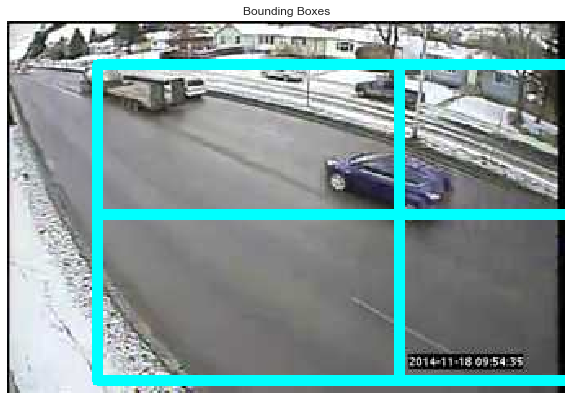

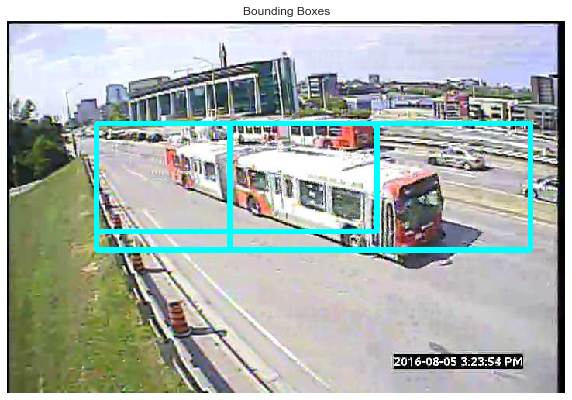

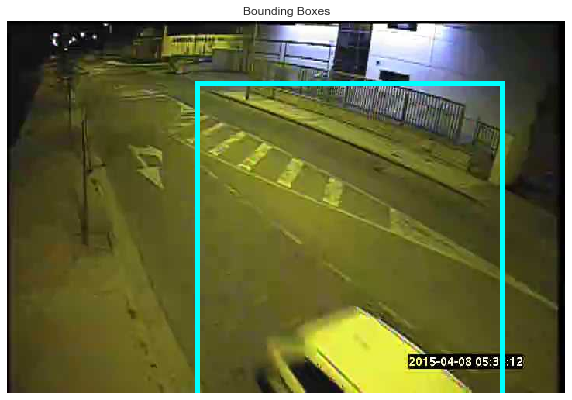

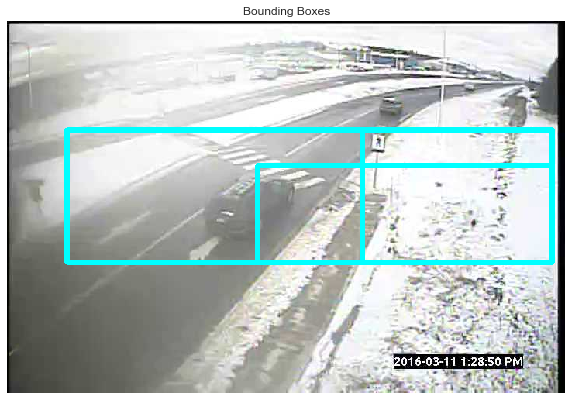

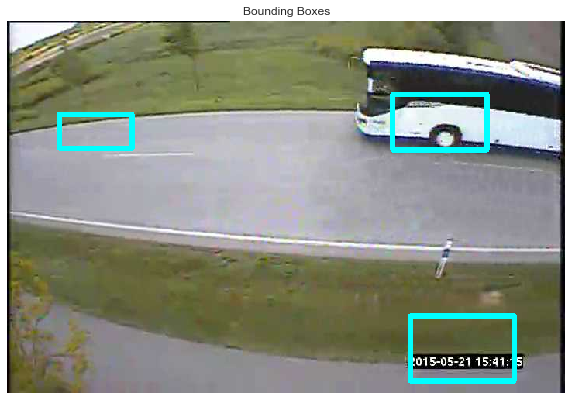

...

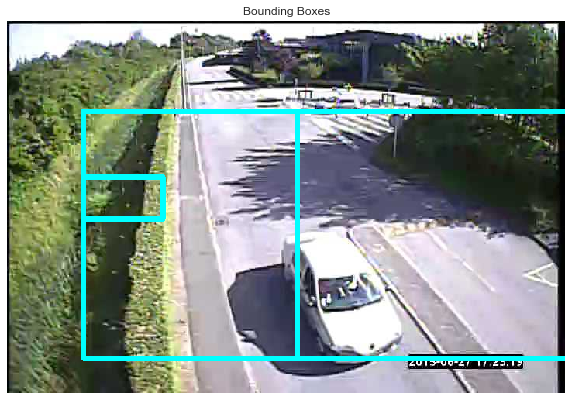

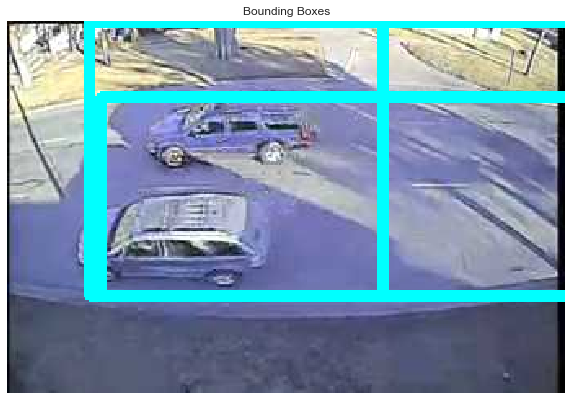

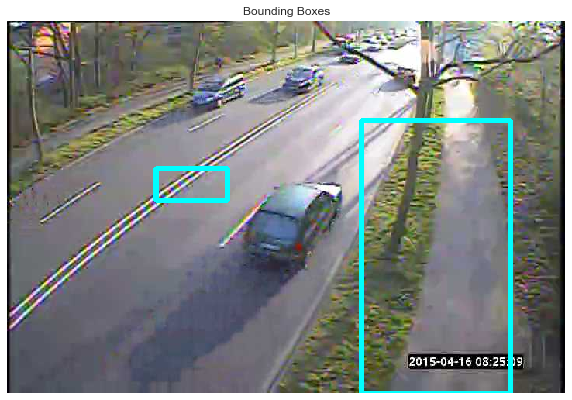

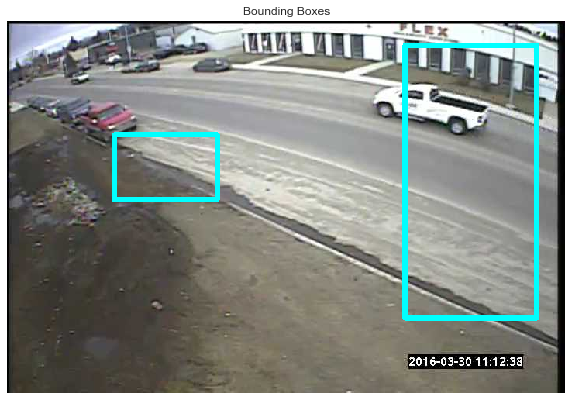

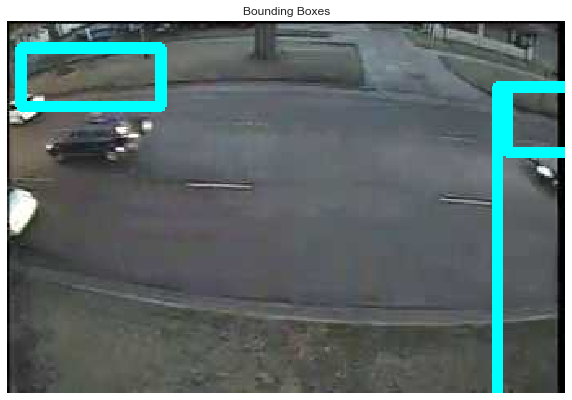

In [101]:
# Get all ground truth boxes for an image:
# Because an image might have multiple objects
# So this function will get the GT for all of those objects
def image_gt(gtl, image_id):
    truths = []
    for g in gtl:
        if image_id == g[0]:
            truths.append(list(g)[1:])
        if (g[0] > image_id):
            break
    return truths 

# Load ground truths
gtl = np.genfromtxt('MIO-TCD-Localization/gt_train.csv', delimiter=',', dtype=['u4', 'U50', 'u4', 'u4', 'u4', 'u4'])

"""
Choose on how many images you want to run the localizer. Also change the directory from train to test if you want to
try the localizer on test images instead of train images
"""
num_images = 50

training_addresses = sorted(glob.glob("MIO-TCD-Localization/train/*.jpg"))[:num_images]
local_images = []
images_truths = [] # has truths of all images (array of arrays of different sizes)
i = 0

# name of the image is its index
for f in training_addresses:
    im = cv2.imread(f)
    local_images.append(im)
    images_truths.append(image_gt(gtl,i))
    i += 1
    
found_boxes = []
for im in local_images:
    f = main(im)
    found_boxes.append(f)
found_boxes = np.array(found_boxes)

In [104]:
# Check the equaloty of two lists
def equal_lists(list1, list2):
    for i in range(len(list1)):
        if(int(list1[i]) != int(list2[i])):
            return False
    return True

# Given a patch of an image that has an object, classify it's object
def predict_patch(box, image):
    image = cv2.cvtColor(image,  cv2.COLOR_BGR2GRAY)
    sub = image[int(box[1]):int(box[3]),int(box[0]):int(box[2])]
    grad = hog(cv2.resize(sub, (50, 50), interpolation=cv2.INTER_AREA)).flatten()
    grad = grad.reshape(1, -1)
    prediction = knn.predict(grad)
    return prediction

# Find the true label of a box from the groundTruth table
def get_true_prediction(box, boxesT):
    pred = 'unknown'

    for b in boxesT:
        boxes = np.array(b)[1:]
        boxes = boxes.astype(np.int)
        if(equal_lists(box,boxes)):
            pred = b[0]
    return pred

all_dices = []
total_preds = 0
good_preds = 0
bad_preds = 0
our_preds = []
true_preds = []


#### THIS IS THE LOOP THAT FINDS DICES AND PREDECTIONS
for i, found in enumerate(found_boxes):
    img = local_images[i]
    #Pick the last 4 element of the ground_truth array (first one is label, last 4 are box)
    coords = np.array(images_truths[i])[:,1:]
    coords = coords.astype(np.int) # convert from string to int
    
    for box in found:
        d, maxCoords = max_dice(box,coords) # Maximize dice for each of the found boxes
        if(d != 0):
            total_preds += 1
            all_dices.append(d)
            
            # True prediciton from the GT label
            truePred = get_true_prediction(list(maxCoords), images_truths[i])
            true_preds.append(truePred)
            
            # Our prediction of the object in the box
            ourPred = predict_patch(box,img)[0]
            our_preds.append(ourPred)
            
            # Keep count of the correct and wrong predictions
            if truePred == ourPred:
                good_preds += 1
            else:
                bad_preds += 1
all_dices = np.array(all_dices)

#### Compute the DICE coeficient for the predicted vs. true bounding boxes (for multiple boxes in one image, match the boxes to maximize the mean DICE).

Refer to the two methods dice() and max_dice() for details on how to the results were found.

We iterated over all the localized boxes and found their max DICE. All of the max DICEs were put in one array 'all_dices' then we found the mean of that array.

In [105]:
print('Mean MAXIMIZED DICE for all validations:', all_dices.mean())
print(len(all_dices))

Mean MAXIMIZED DICE for all validations: 0.2885210457143522
116


#### Report the distribution of DICE coeficients over your validation sets.

We split our data into 10 sets then find the mean DICE for each set. We understand that we should've split the data initally before finding the boxes. However, this wasn't possible in our case because of the way we were training the localizer. We were tarining the localizer to identify background and non-background then use k-means to combine boxes. Therefore literally the kind of images that were used to develope the model (actual images of backgrounds and non-backgrounds) are different from the images that will be used to test the model (large images that have many objects in them). 

[0.32417135 0.31097081 0.24974187 0.35501266 0.33604275 0.37974617
 0.18295713 0.22580452 0.32150207 0.17884664]


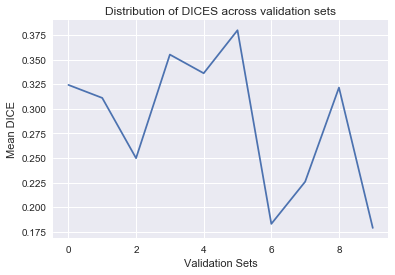

In [107]:
split_dices = np.array_split(np.array(all_dices),10)
means = []

for split in split_dices:
    means.append(np.array(split).mean())
means = np.array(means)

print(means)

plt.plot(means); plt.title("Distribution of DICES across validation sets")
plt.xlabel("Validation Sets"); plt.ylabel("Mean DICE");plt.show()

#### Use the localization predicted by your localizer to evaluate your classifier from Section 2. Compare the accuracy, prediction, and recall of using your localizer + classifier vs. using the classification data + classifier. Is there a difference, and why/why not? Should the 'background' label of the classifier be included when evaluating the performance of the localizer, and why/why not?

As seen in the numbers below, our accuracy, predictions, and recall are relativly low. This is expected because our localizer had a mean DICE coefficient of less than 20% in best cases. When looking at the generated boxes in the images, we can see that there's at least one box that localized on or near an object. Sometime this box will not cover the whole object so when we sent it through the classifier it will predict a wrong result. Since our non-deep learning localizer performed realitivly well (70% accuracy), we expect it to perform well at least here if the localization was accurate.

Should background label be included? We think no. To begin with, we train our localizer to distinguish between background and not-background. Every box should localize around an object that is not a background. Now the box might be correctly around an object, but for some reason the classifier predicts a "background" for that object. This is why we this background shouldn't be included, because sometimes the localizer is correct, but because of the accuracy of the classifier we get a bad result to what should've been a good result.

In [58]:
import warnings
warnings.filterwarnings('ignore')

# or use sklearn function and output average instead of list
localize_pred_precision = precision(true_preds, our_preds, average = 'weighted')

localize_pred_recall = recall(true_preds, our_preds, average = 'weighted')

print("Accuracy %", 100 * good_preds/total_preds)
print("Precision %", 100 * localize_pred_precision)
print("Recall %", 100 * localize_pred_recall)

Accuracy % 4.166666666666667
Precision % 23.11111111111111
Recall % 4.166666666666666
